This notebook implements my final project

In [1]:
# Imports
import os
import random
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from torch import utils, optim
from torchvision import datasets, transforms, models
from math import sqrt
from PIL import Image

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image


This was run on a GPU to improve speed. However, if you want to rerun it on a cpu, set USE_CUDA to False

In [2]:
# Set to False if not wanting to use GPU
USE_CUDA = True
if USE_CUDA and torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

This class loads the test and train images

In [4]:
class Dataset(utils.data.Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        self.data_info = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.data_info)

    def __getitem__(self, idx):
        img_number = self.data_info.iloc[idx]['id']
        img_name = os.path.join(self.root_dir, f"{img_number}.JPG")
        image = Image.open(img_name).convert('RGB')
        label = self.data_info.iloc[idx]['label']
        
        if self.transform:
            image = self.transform(image)
        
        return image, label

In [31]:
class ResnetCNN(nn.Module):
    def __init__(self):
        super(ResnetCNN, self).__init__()
        self.resnet = models.resnet18(weights=models.ResNet18_Weights)
        self.resnet.fc = nn.Identity()
        self.fc_layers = nn.ModuleList([
            nn.Linear(512, 1024),
            nn.Dropout(0.5),
            nn.Linear(1024, 1024),
            nn.Dropout(0.5),
            nn.Linear(1024, 2)
        ])

    def forward(self, x):
        x = self.resnet(x)
        for layer in self.fc_layers:
            x = layer(x)
        return x

Here, we load the Pokemon dataset. We also apply our transforms. We choose batch size to be 16

In [32]:
BATCH_SIZE = 16

train_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Lambda(lambda x : x + (random.choice([0, 0.1, sqrt(0.1), 1])) * torch.randn_like(x)),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

train_set = Dataset(
    csv_file="images/train_labels.csv", 
    root_dir="images/train", 
    transform=train_transform
)
test_set = Dataset(
    csv_file="images/test_labels.csv", 
    root_dir="images/test", 
    transform=test_transform
)

train_loader = utils.data.DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
test_loader = utils.data.DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

The following three functions are the optimizer, train, and test functions respectively. The optimizer of choice is the SGD optimizer, and a learning rate of 0.1 was chosen. For the train and test functions, we compute the loss over the entire applicable dataset as well as the percentage of correct predictions (as a decimal) the model makes.

In [33]:
def model_optimizer(model, lr=0.001): 
    return optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=0.0005)

def train(train_loader, device, optimizer, model):
    model.train()
    running_loss = 0
    accuracy = 0
    criterion = nn.CrossEntropyLoss()
    
    for inputs, target in train_loader:
        inputs, target = inputs.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(inputs)
        
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
        preds = output.argmax(dim=1)
        accuracy += (preds == target).sum().item()
        
    return running_loss / len(train_loader.dataset), accuracy / len(train_loader.dataset)

def test(test_loader, device, model):
    model.eval()
    running_loss = 0
    accuracy = 0
    criterion = nn.CrossEntropyLoss()
    
    with torch.no_grad():
        for inputs, target in test_loader:
            inputs, target = inputs.to(device), target.to(device)
            output = model(inputs)
            
            loss = criterion(output, target)
            running_loss += loss.item() * inputs.size(0)
            preds = output.argmax(dim=1)
            accuracy += (preds == target).sum().item()
            
    return running_loss / len(test_loader.dataset), accuracy / len(test_loader.dataset)

We then initialize the neural net and run the train and test functions over 5 epochs, keeping track of the resulting losses and percentage of correct predictions.

In [35]:
%%time

EPOCH = 250

model = ResnetCNN().to(device)
optimizer = model_optimizer(model)

print('Starting....')

train_loss_graph = []
train_accuracy_graph = []
test_loss_graph = []
test_accuracy_graph = []
for e in range(EPOCH):
    train_loss, train_accuracy = train(train_loader, device, optimizer, model)
    train_loss_graph.append(train_loss)
    train_accuracy_graph.append(train_accuracy)
    test_loss, test_accuracy = test(test_loader, device, model)
    test_loss_graph.append(test_loss)
    test_accuracy_graph.append(test_accuracy)
    
    # print(f"Train: Epoch: {e}: Loss: {train_loss}; Accuracy: {train_accuracy}")
    # print(f"Test:  Epoch: {e}: Loss: {test_loss}; Accuracy: {test_accuracy}")

print('Finished!')
    

Starting....
Finished!
CPU times: total: 55min 25s
Wall time: 6min 58s


Finally, we graph the loss and percentage of correct predictions for both the training and testing stages.

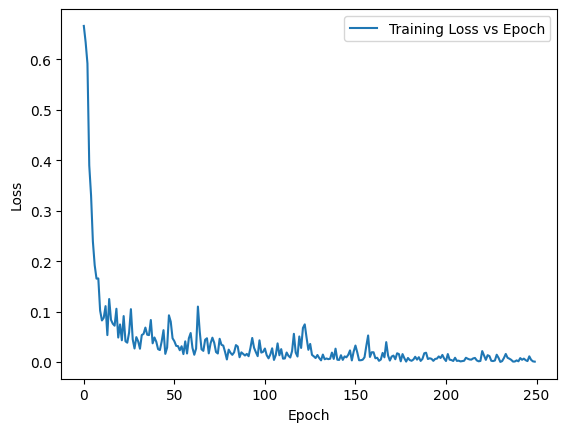

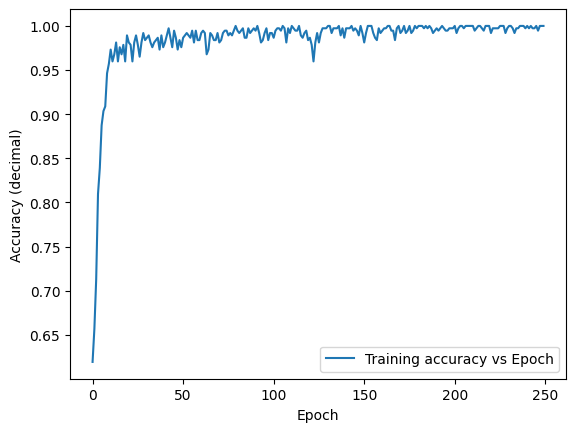

Training Loss: 0.004493070852278904 ,Training accuracy: 0.9986595174262733


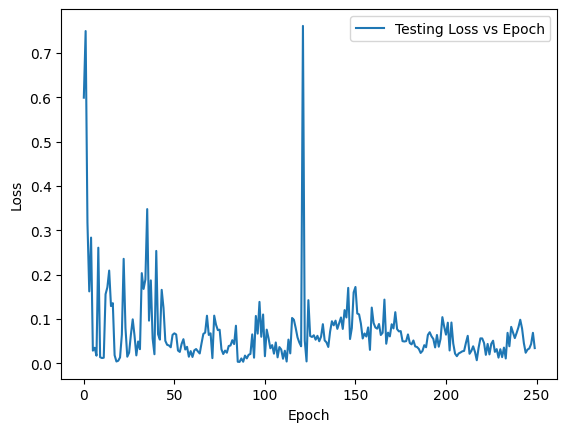

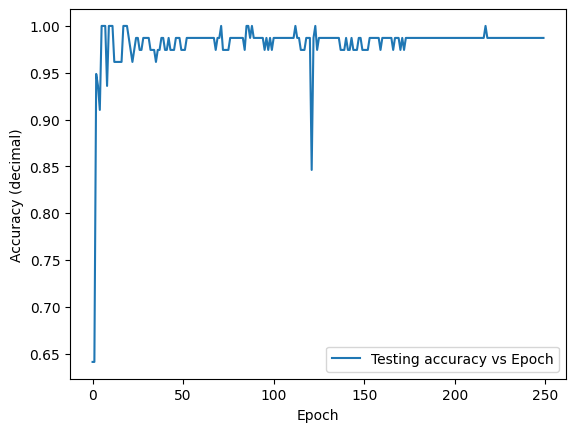

Testing Loss: 0.05414789774024022, Testing accuracy: 0.9871794871794872


In [46]:
# Training loss
plt.plot(train_loss_graph, label='Training Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Training correct predicitons
plt.plot(train_accuracy_graph, label='Training accuracy vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (decimal)')
plt.legend()
plt.show()

print(f"Training Loss: {sum(train_loss_graph[-10:])/10} ,Training accuracy: {sum(train_accuracy_graph[-10:])/10}")

# Testing loss
plt.plot(test_loss_graph, label='Testing Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Testing correct predictions
plt.plot(test_accuracy_graph, label='Testing accuracy vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (decimal)')
plt.legend()
plt.show()

print(f"Testing Loss: {sum(test_loss_graph[-10:])/10}, Testing accuracy: {sum(test_accuracy_graph[-10:])/10}")

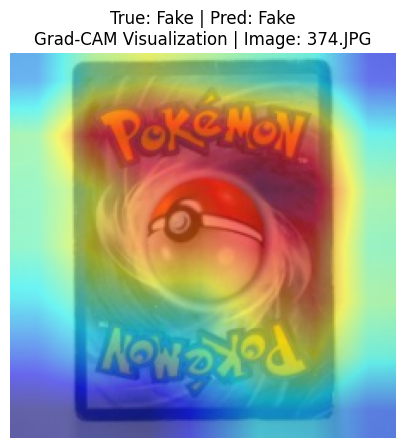

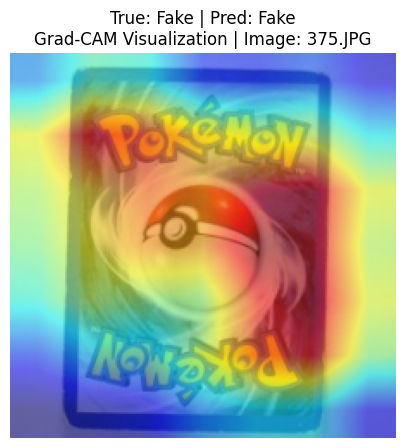

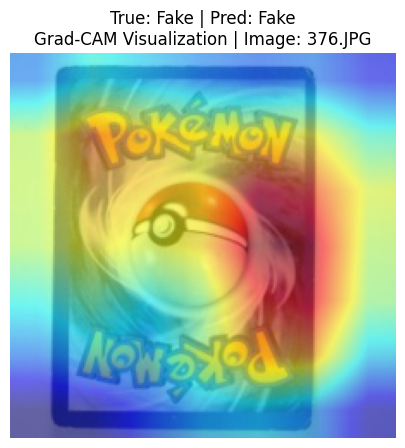

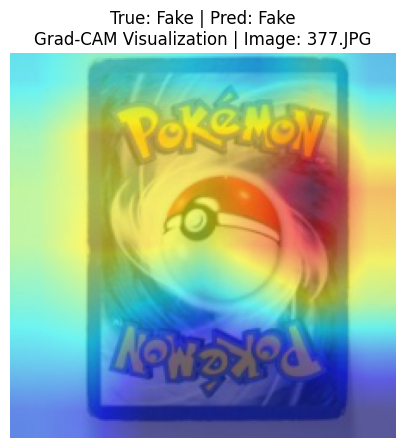

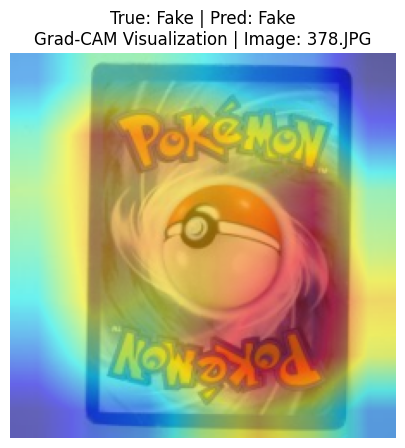

...

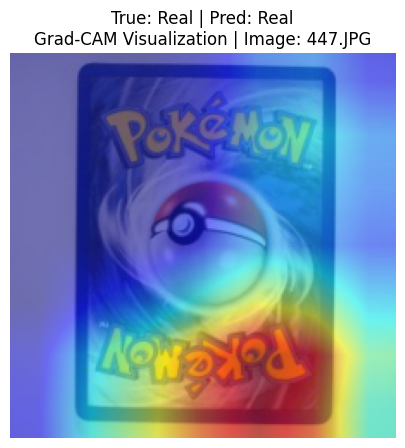

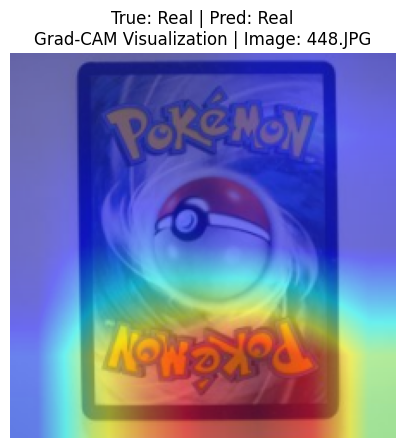

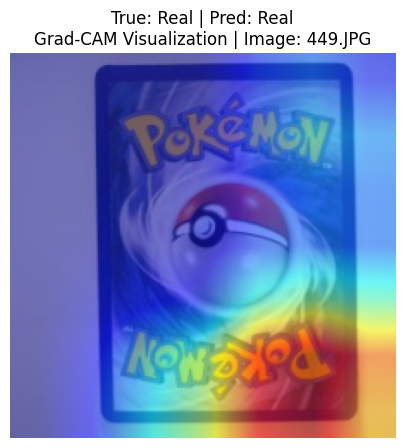

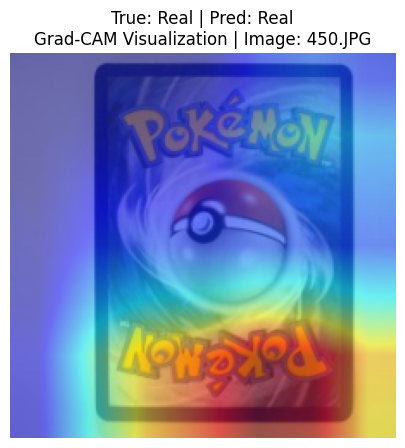

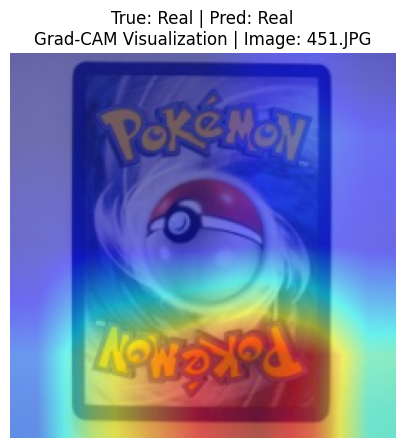

In [48]:
def visualize_card_decision(image_tensor, true_label, model, device, image_number):
    input_tensor = image_tensor.unsqueeze(0).to(device)
    
    model.eval()
    with torch.no_grad():
        output = model(input_tensor)
        pred_prob = torch.sigmoid(output) if output.shape[1] == 1 else torch.softmax(output, dim=1)
        pred_class = pred_prob.argmax().item()

    label_map = {0: "Fake", 1: "Real"}
    true_label_txt = label_map[true_label.item()]
    pred_label_txt = label_map[pred_class]

    inv_normalize = transforms.Normalize(
        mean=[-0.485/0.229, -0.456/0.224, -0.406/0.225],
        std=[1/0.229, 1/0.224, 1/0.225]
    )
    image = inv_normalize(image_tensor).cpu().numpy().transpose(1, 2, 0)
    image = np.clip(image, 0, 1)
    
    target_layer = model.resnet.layer4
    cam = GradCAM(model=model, target_layers=[target_layer])
    grayscale_cam = cam(input_tensor=input_tensor)[0]
    visualization = show_cam_on_image(image, grayscale_cam, use_rgb=True)

    plt.figure(figsize=(10, 5))
    plt.imshow(visualization)
    plt.title(f"True: {true_label_txt} | Pred: {pred_label_txt}\nGrad-CAM Visualization | Image: {image_number}.JPG", fontsize=12)
    plt.axis('off')
    plt.show()

image_number = 374
for images, labels in test_loader:
    for i in range(len(images)):
        visualize_card_decision(
            images[i],
            labels[i],
            model,
            device,
            image_number
        )
        image_number += 1

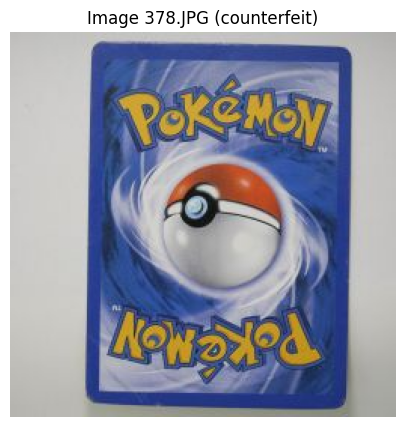

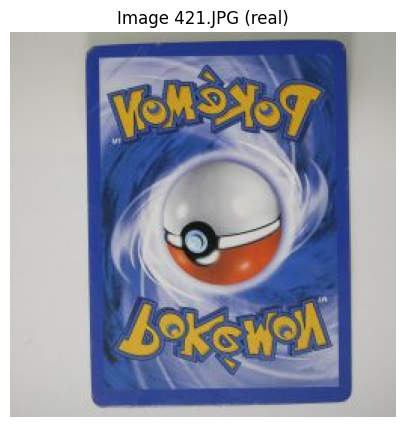

In [22]:
counterfeit_img_path = "images/test/378.JPG" 
counterfeit_pil_img = Image.open(counterfeit_img_path).convert('RGB')

counterfeit_rgb_img = np.array(counterfeit_pil_img, dtype=np.float32) / 255.0

plt.figure(figsize=(10, 5))
plt.imshow(counterfeit_rgb_img)
plt.title("Image 378.JPG (counterfeit)")
plt.axis("off")
plt.show()

real_img_path = "images/test/421.JPG" 
real_pil_img = Image.open(real_img_path).convert('RGB')

real_rgb_img = np.flip(np.array(counterfeit_pil_img, dtype=np.float32) / 255.0, axis=0)

plt.figure(figsize=(10, 5))
plt.imshow(real_rgb_img)
plt.title("Image 421.JPG (real)")
plt.axis("off")
plt.show()